<a href="https://colab.research.google.com/github/grackim/HelminthBioinformatics_2023/blob/main/Module_11_Spatial_transcriptomics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Module 11 - Spatial transcriptomics
## Tutorial links
https://ludvigla.github.io/STUtility_web_site/Spatial_Features.html#Matrix_factorization <br>
https://satijalab.org/seurat/articles/spatial_vignette.html <br>
https://ludvigla.github.io/STUtility_web_site/Quality_Control.html

## Download the raw data and the code used in the paper
https://zenodo.org/record/4751624#.Y17sri_pMUF

# Setup

First of all, let's install all required libraries and R packages.

In [ ]:
## https://stackoverflow.com/questions/70025153/how-to-access-the-shell-in-google-colab-when-running-the-r-kernel
shell_call <- function(command, ...) {
  result <- system(command, intern = TRUE, ...)
  cat(paste0(result, collapse = "\n"))
}

## Setup R2U
download.file("https://github.com/eddelbuettel/r2u/raw/master/inst/scripts/add_cranapt_jammy.sh",
              "add_cranapt_jammy.sh")
Sys.chmod("add_cranapt_jammy.sh", "0755")
shell_call("./add_cranapt_jammy.sh")
bspm::enable()
options(bspm.version.check=FALSE)

## Install the R packages
cranPkgs2Install = c("BiocManager", "Seurat", "cowplot", "ggpubr", "stringr", "patchwork", "DT","ggcorrplot","scatterpie",
                     "clustree","Matrix","terra","data.table","ggplot2","plotly","RColorBrewer","dplyr","remotes")
install.packages(cranPkgs2Install, ask=FALSE, update=TRUE, quietly=TRUE)
biocPkgs2Install = c("clusterProfiler", "ReactomePA", "enrichR", "org.Hs.eg.db", "SingleCellExperiment", "SPOTlight",
                    "hdf5r", "limma")
BiocManager::install(biocPkgs2Install, ask=FALSE, update=TRUE, quietly=TRUE)
# remotes::install_github("ludvigla/semla", force=TRUE)
remotes::install_github("jbergenstrahle/STUtility", force=TRUE)

loadPackages = function(pkgs){
  myrequire = function(...){
    suppressPackageStartupMessages(require(...))
  }
  ok = sapply(pkgs, require, character.only=TRUE, quietly=TRUE)
  if (!all(ok)){
    message("There are missing packages: ", paste(pkgs[!ok], collapse=", "))
  }
}


19 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists...
Building dependency tree...
Reading state information...
wget is already the newest version (1.21.2-2ubuntu1).
ca-certificates is already the newest version (20230311ubuntu0.22.04.1).
gnupg is already the newest version (2.2.27-3ubuntu2.1).
gnupg set to manually installed.
0 upgraded, 0 newly installed, 0 to remove and 19 not upgraded.
-----BEGIN PGP PUBLIC KEY BLOCK-----

mQINBFM+sY8BEADA70T+U0/2WNjOTLvytuXLvBC4vgA8hYvOaBS1cL3d8lu4mwr4
W84/6p4v/mXle/0eIO2D2g+XfK72ZHZxpS+bb7yPxrkCDLGxwUd/khtTJHSbbKFo
J73AsABflMe+8qv+E74+QTiXErTCNioFRz18sa0EvOnEAiokau6TZVYY2z9YjBNI
yEjTi+z+g8c1RL6VmrFEpTicTpafOLbkRyw0VKnAKG7Ytp3Ksc1G9/IAoKw3Q9La
0DJb5iX6hyB7+PNid6htK4LtPKZ2dNSrnRvNNkjj5BgcM2AT1hmxbzHNzIVmPoKA
CQFrkdjog3/PcyjdtZG7cfoSDXrbIAZeAa2ngLv9C/DJatVDd6maPOe66gLo7+As
ErMvO9vtiouqLdurW+Lhx0jFW9Ca3g1taLfbSDyS3X1mOGWcisbQvBqkIuoDQTeS
V4Z04wrwTZ1HtweKG/s5fmPtZNGWVI5YNRLIwdmbGzFTMPu2XTAOd+xSK2H+46Kh
Sh4kFeP6p

Tracing function "install.packages" in package "utils"

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.rstudio.com

Bioconductor version 3.17 (BiocManager 1.30.21.1), R 4.3.1 (2023-06-16)

Installing package(s) 'BiocVersion', 'clusterProfiler', 'ReactomePA',
  'enrichR', 'org.Hs.eg.db', 'SingleCellExperiment', 'SPOTlight', 'hdf5r',
  'limma'

Old packages: 'BiocParallel', 'bit', 'cpp11', 'curl', 'DelayedArray',
  'devtools', 'DOSE', 'fs', 'gargle', 'gert', 'ggtree', 'highr', 'isoband',
  'MatrixGenerics', 'openssl', 'roxygen2', 'S4Arrays', 'treeio', 'whisker',
  'boot', 'foreign', 'spatial'




tiff       (NA -> 0.1-11) [CRAN]
jpeg       (NA -> 0.1-10) [CRAN]
bmp        (NA -> 0.3   ) [CRAN]
readbitmap (NA -> 0.1.5 ) [CRAN]
shinyjs    (NA -> 2.1.0 ) [CRAN]
magick     (NA -> 2.7.4 ) [CRAN]
raster     (NA -> 3.6-23) [CRAN]
imager     (NA -> 0.45.2) [CRAN]
zeallot    (NA -> 0.1.0 ) [CRAN]


Installing 9 packages: tiff, jpeg, bmp, readbitmap, shinyjs, magick, raster, imager, zeallot



── R CMD build ─────────────────────────────────────────────────────────────────
* checking for file ‘/tmp/RtmpuVPdrO/remotesd97aa1e924/jbergenstrahle-STUtility-9a8f421/DESCRIPTION’ ... OK
* preparing ‘STutility’:
* checking DESCRIPTION meta-information ... OK
* checking for LF line-endings in source and make files and shell scripts
* checking for empty or unneeded directories
* building ‘STutility_1.1.1.tar.gz’



Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
## To simplify package loading, we created the loadPackages()
## function. But, if you don't have the function, you should
## use 'library(name_of_package)'
pkgs = c("data.table", "Seurat", "ggplot2", "plotly",
         "RColorBrewer", "clustree", "dplyr", "STutility")
loadPackages(pkgs)

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout



Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, s

# Download the data

In [ ]:
download.file('https://iauchile-my.sharepoint.com/:u:/g/personal/adolfo_rh_postqyf_uchile_cl/EfjJEURo--BOiy13A9w1FwgBcFnFIUTccVr4F6G-hBcHBg?e=YyXt9A&download=1','ST_Exercises.zip')

shell_call("ls -lh")
shell_call("unzip ST_Exercises.zip")

total 2.4G
-rwxr-xr-x 1 root root 2.0K Aug  2 20:37 add_cranapt_jammy.sh
drwxr-xr-x 1 root root 4.0K Aug  1 13:35 sample_data
-rw-r--r-- 1 root root 2.4G Aug  2 20:42 ST_Exercises.zipArchive:  ST_Exercises.zip
   creating: ST_Exercises/
  inflating: __MACOSX/._ST_Exercises  
  inflating: ST_Exercises/Exercise1_dataset.RData  
  inflating: ST_Exercises/.DS_Store  
  inflating: __MACOSX/ST_Exercises/._.DS_Store  
   creating: ST_Exercises/her2st-master/
  inflating: __MACOSX/ST_Exercises/._her2st-master  
   creating: ST_Exercises/10X_Spatial_T_Breast_Block_A_Section2/
  inflating: __MACOSX/ST_Exercises/._10X_Spatial_T_Breast_Block_A_Section2  
  inflating: ST_Exercises/scRNASeq_pac2_processed.rds  
  inflating: __MACOSX/ST_Exercises/._scRNASeq_pac2_processed.rds  
   creating: ST_Exercises/10X_Spatial_T_Breast_Block_A_Section1/
  inflating: __MACOSX/ST_Exercises/._10X_Spatial_T_Breast_Block_A_Section1  
   creating: ST_Exercises/her2st-master/res/
  inflating: __MACOSX/ST_Exercises/her2

# EXERCISE 1: RECOVER THE PATHOLOGIST ANNOTATIONS

## Load the data set

First of all, let's load the dataset. This is a preprocessed dataset containing spatial transcriptomics data derived from three sections of a HER2-positive breast cancer sample ([Andersson et al 2020](https://www.biorxiv.org/content/10.1101/2020.07.14.200600v1.full)).
Normalization, dimensionality reduction, PCA, and UMAP were already performed on this object.

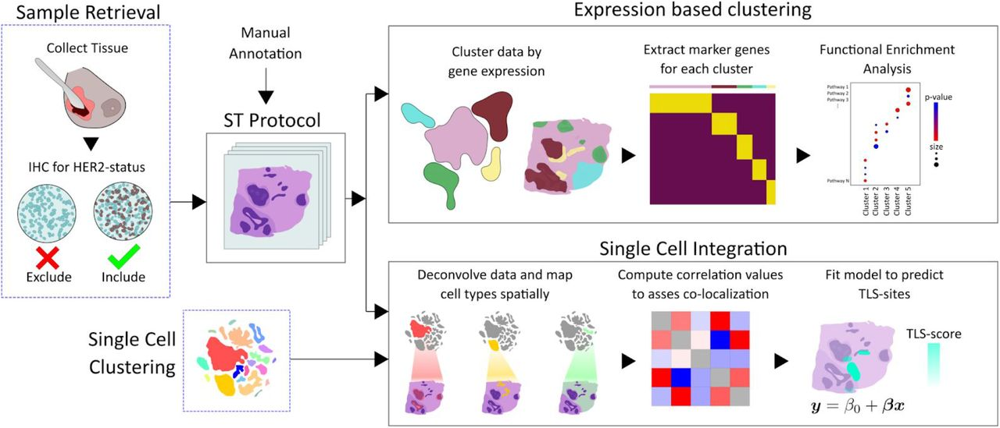

In [ ]:
load(file = "ST_Exercises/Exercise1_dataset.RData")
# Get some information about the dataset
DefaultAssay(Her2p)
dim(Her2p)
table(Her2p@meta.data$ids)

# Make plots wider
options(repr.plot.width=15, repr.plot.height=8)

[1] "SCT"

[1] 10885  1352


 G1  G2  G3 
437 466 449 

## Quality control plots

There are multiple ways of visualizing information about spatial datasets. Just like on single cell RNA datasets, we can check the distribution of UMIs or feature counts using violin plots or scatterplots.

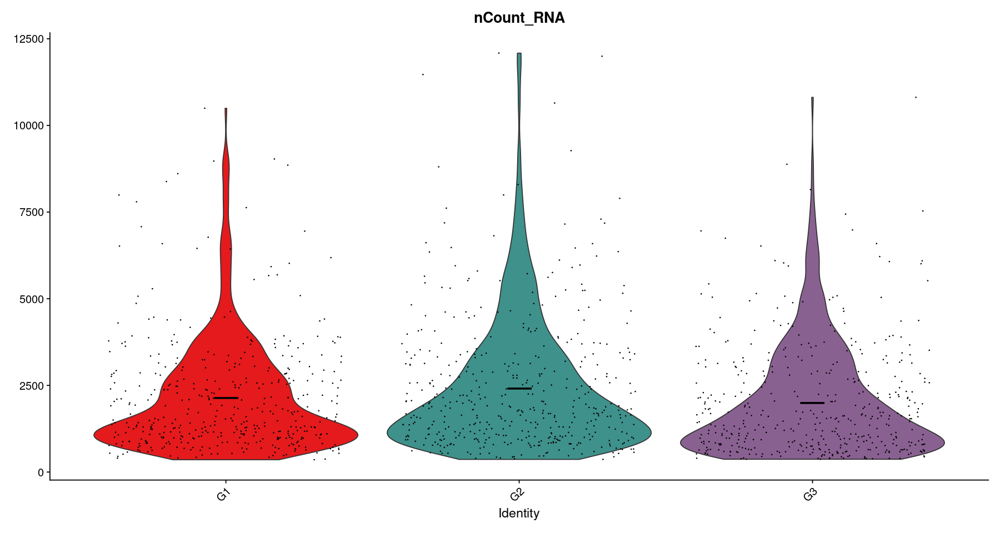

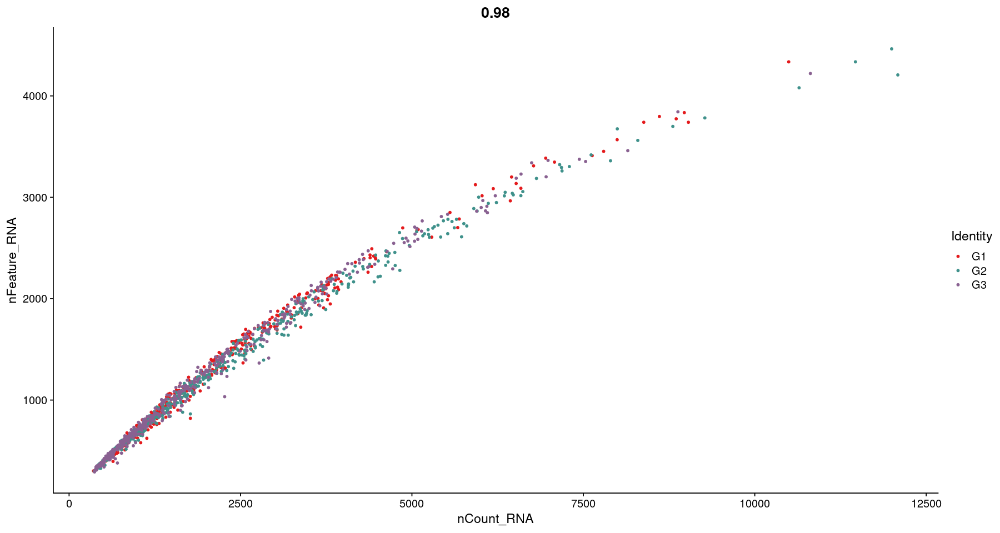

In [ ]:
# Create the color palette
getPalette = colorRampPalette(brewer.pal(8, "Set1"))
color = getPalette(6)

# Violin plots
VlnPlot(Her2p, features = "nCount_RNA", group.by = "ids", pt.size = 0.1, cols = color) +
  stat_summary(fun=mean, geom="point", shape=95, size=15, color = "black") + NoLegend()

# Scatterplot
FeatureScatter(object = Her2p, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "ids", cols = color)

Another way of visualizing this data in spatial datasets is overlaying the data with the tissue slide image. That way, we can see how the feature we're interested in is spatially distributed on the spots. In the example below, we're overlaying UMI counts over the slides in order to see which portions of the tissue showed the highest counts.

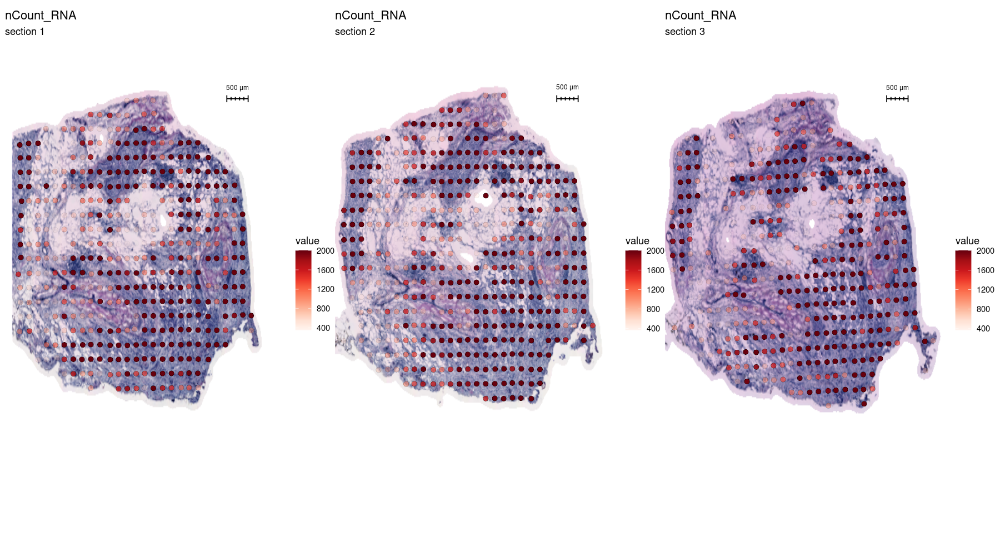

In [ ]:
FeatureOverlay(Her2p, features = c("nCount_RNA"),
               sampleids = 1:3,
               pt.size = 2.5,
               add.alpha = TRUE,
               ncol = 3, min.cutoff = 0, max.cutoff = 2000)

In [ ]:
#Exercise: Save the image to a file


## Clustering

We can test multiple clustering resolutions in order to choose the one that we consider the best one. To help us choose, we can visualize a cluster tree which shows us how samples move from one cluster to another once we increase resolution and how stable the clusters are across resolutions.

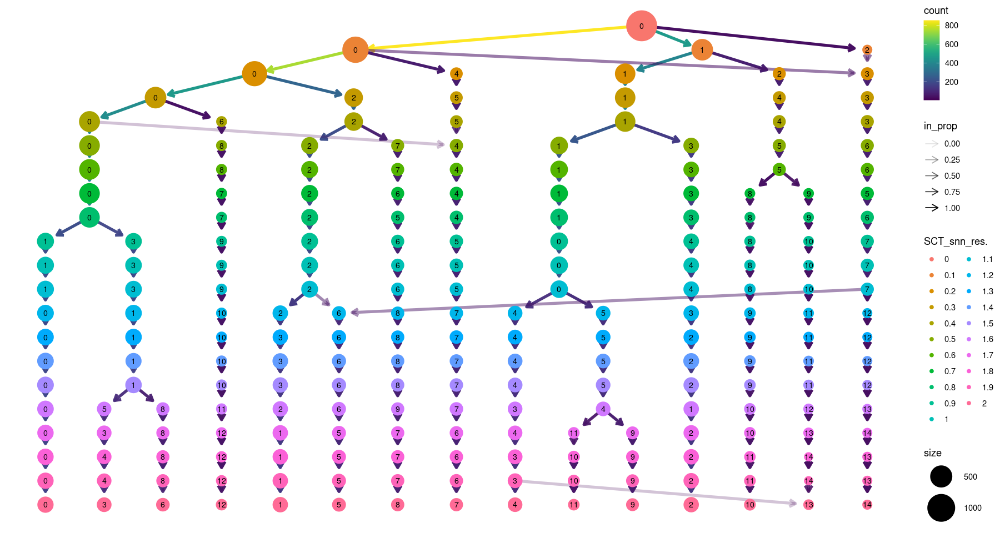

In [ ]:
#Perform Seurat graph-based clustering
Her2p <- FindNeighbors(object = Her2p, dims = 1:10, reduction = "NMF", verbose = FALSE)
Her2p <- FindClusters(Her2p, resolution = seq(0, 2, by = 0.1), verbose = FALSE)
#Choice of a resolution
clustree(Her2p, prefix = "SCT_snn_res.")

We can then plot the UMAP to see how well the spots are clustered in different resolutions. Feel free to explore!

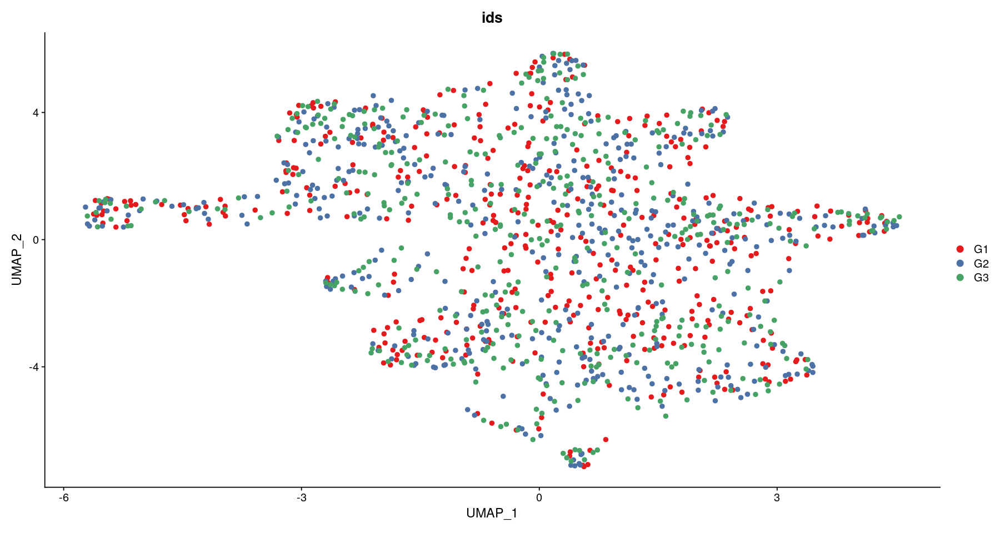

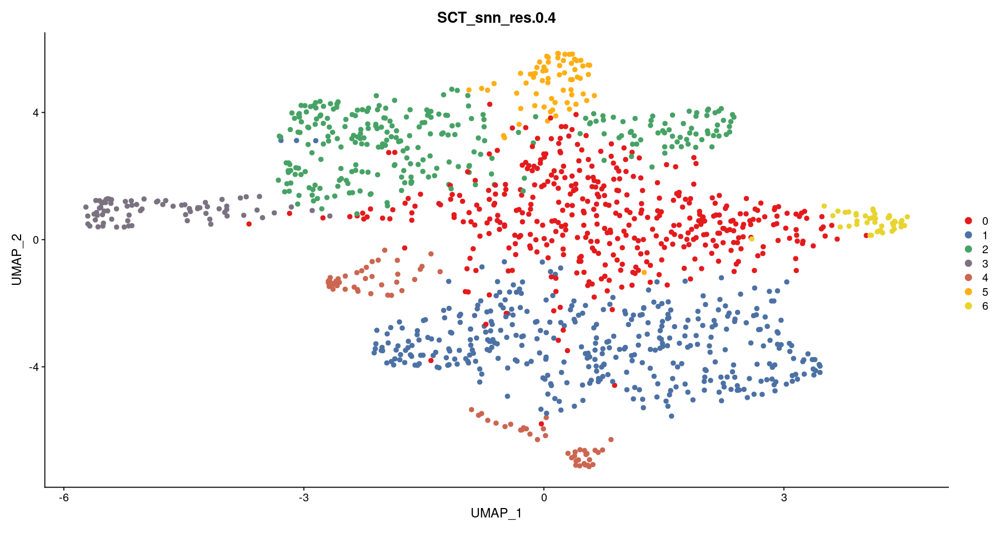

In [ ]:
#plot the UMAP
color = getPalette(9)
DimPlot(Her2p, reduction = "umap", label = FALSE, group.by = "ids",
        pt.size = 2, cols=color, label.size=13)

DimPlot(Her2p, reduction = "umap", label = FALSE, group.by = "SCT_snn_res.0.4",
        pt.size = 2, cols=color, label.size=13)

As previously seen with different features, we can also overlay cluster identity over the slide's spots to see how they are spatially distributed in the tissue.

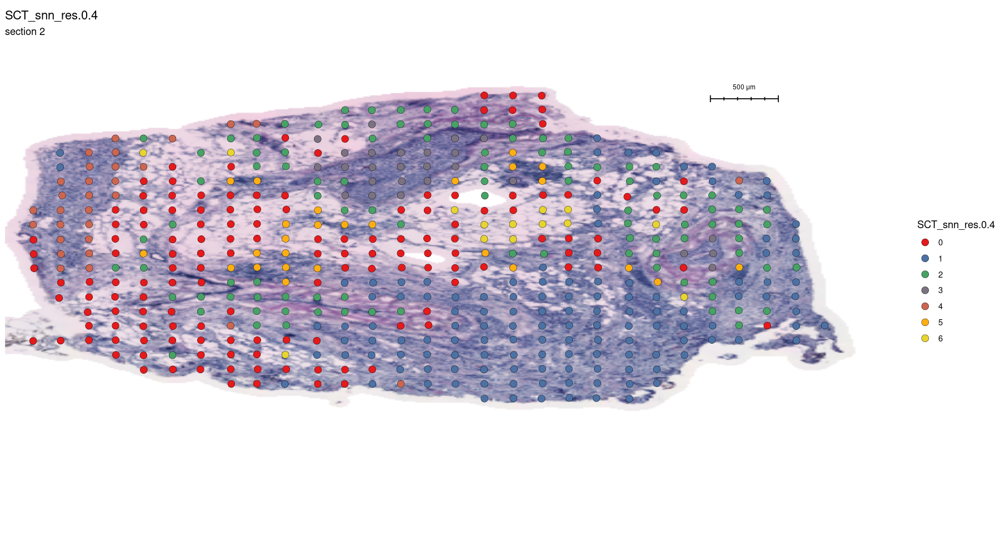

In [ ]:
#plot only the slide 3 of the patient G
FeatureOverlay(Her2p, features = c("SCT_snn_res.0.4"),
               sampleids = 2, #only slide 2
               pt.size = 3.5,
               cols = color,
               add.alpha = TRUE,
               ncol = 1)

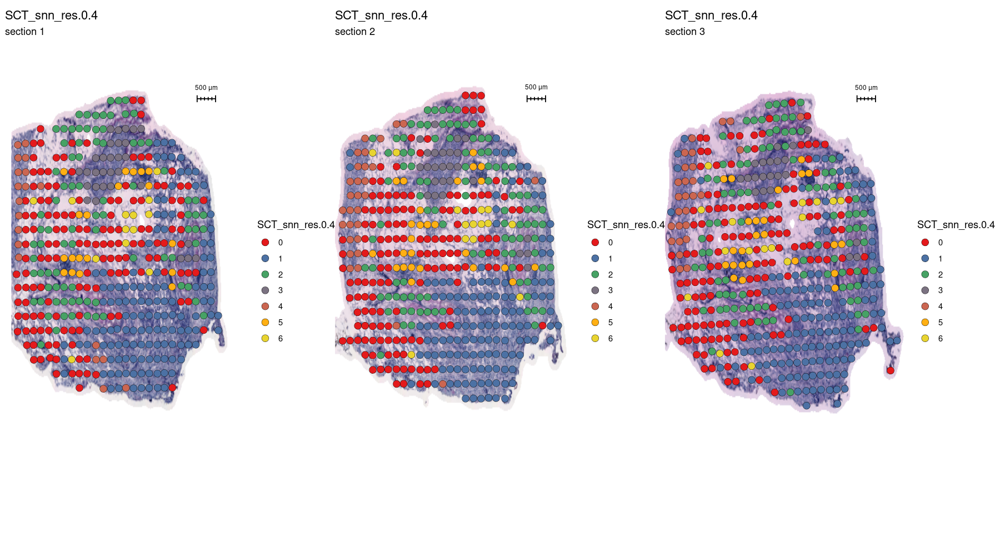

In [ ]:
#plot only the 3 slides of patient G
FeatureOverlay(Her2p, features = c("SCT_snn_res.0.4"),
               sampleids = 1:3, # plot slides 1 to 3
               pt.size = 3.5,
               cols = color,
               add.alpha = TRUE,
               ncol = 3)

In [ ]:
#Exercice: Save the image to a file


Another option is plotting the spots without the tissue image on the background. Sometimes this makes it easier to see the spots' colors.

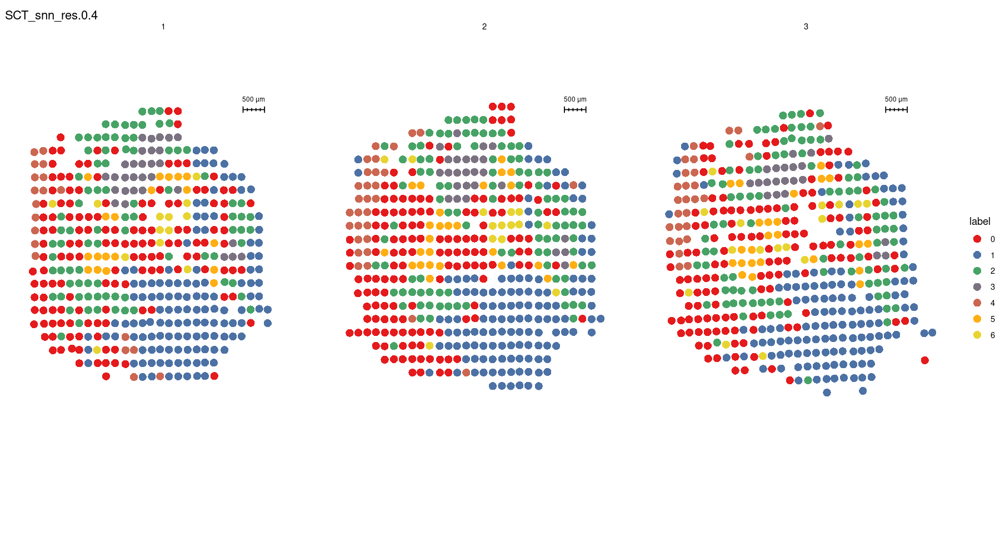

In [ ]:
#plot the clusters without HE images
ST.FeaturePlot(object = Her2p, features = "SCT_snn_res.0.4", cols = color, pt.size = 4, ncol = 3)

We can also plot clusters one at a time to reduce overlaps and to increase visibility.

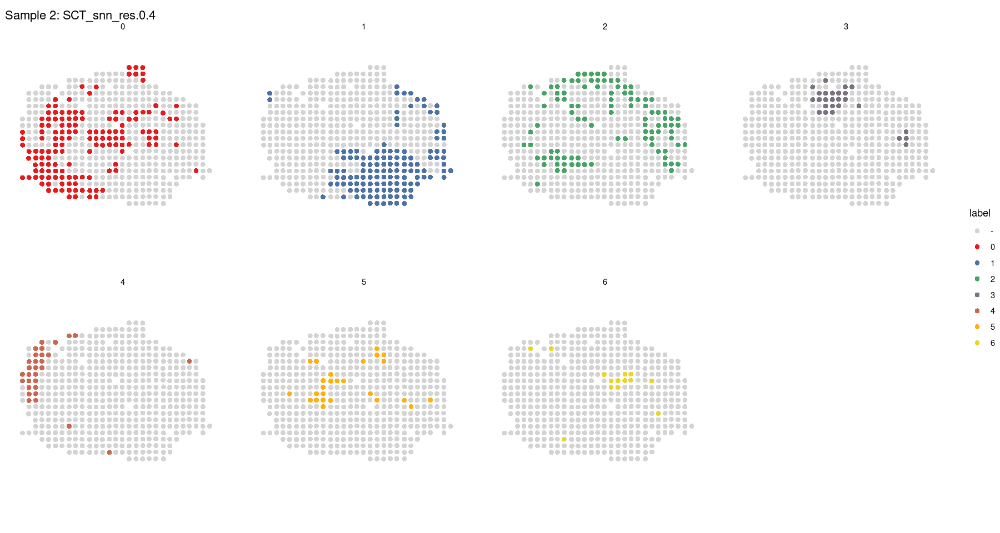

In [ ]:
#split the view for each cluster
ST.FeaturePlot(object = Her2p, features = "SCT_snn_res.0.4", pt.size = 2.5,
               split.labels = T, indices = 2, show.sb = FALSE, ncol = 4, cols = color)

## Differentially expressed genes

Like in single cell analysis, we can identify differentially expressed genes among clusters. In this case, however, each cluster corresponds to groups of **spots** instead of groups of single cells, so keep that in mind. In this part, we will identify marker genes for each cluster and identify DEGs for each of them.

In [ ]:
DefaultAssay(Her2p) #check the active assay
Idents(Her2p) <- "SCT_snn_res.0.4" # we have selected 0.4 resolution for cluster identity
#Comparison of all clusters vs all clusters
Her2p.markers <- FindAllMarkers(object = Her2p, only.pos = TRUE, min.pct = 0.10, logfc.threshold = 0.10)
Her2p.markers = Her2p.markers[which(Her2p.markers$p_val_adj<0.05),]
table(Her2p.markers[, "cluster"]) #How many DEGs per cluster ?

[1] "SCT"

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6




   0    1    2    3    4    5    6 
  16 1460   43  499  123  375   16 

We can check the top 5 DEGs to have an overview of which genes are most expressed in each cluster.

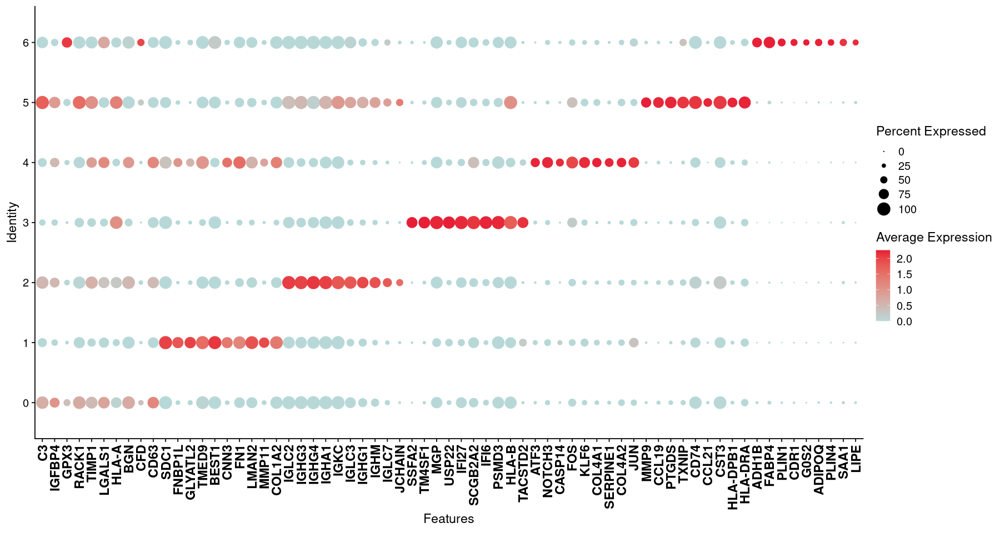

In [ ]:
#Select the top 10 DEG of each cluster
Her2p.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC) -> top10
DotPlot(Her2p, features = unique(top10$gene), group.by = "SCT_snn_res.0.4", cols = c('#b8d8d8', '#e71d36'),
        dot.scale = 6, col.min = 0) + theme(axis.text.x = element_text(face = "bold", color = c("black"), size = 14,angle = 90, hjust = 1, vjust = 0.5))

In [ ]:
#Exercise: Save the image to a file


We can also check how the expression of some of these DEGs is distributed per cluster using ridge plots.

Picking joint bandwidth of 0.197

Picking joint bandwidth of 0.174



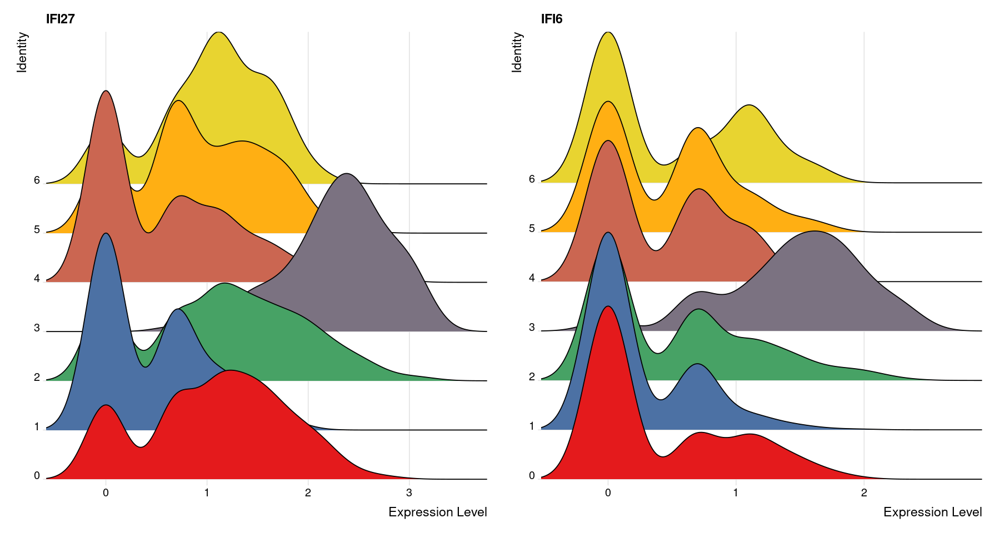

In [ ]:
#Plot key genes in the ridge plot
RidgePlot(Her2p, assay = "SCT", features = c("IFI27","IFI6"), ncol = 2, group.by = "SCT_snn_res.0.4", cols = color)


Likewise, we can check how genes are expressed along the UMAP and their expression distribution in the tissue.

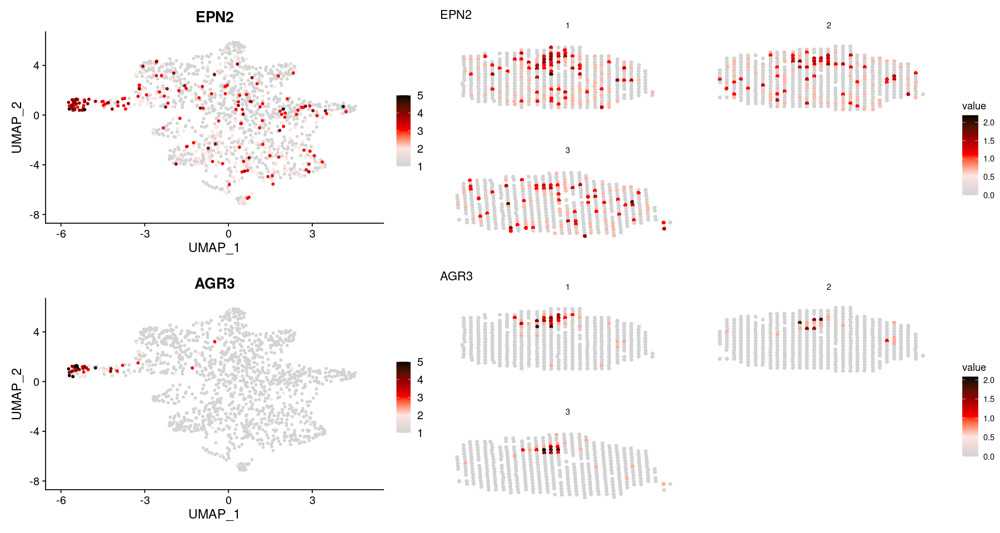

In [ ]:
#UMAP and Heatmap visualization
heatmap.colors <- c("lightgray", "mistyrose", "red", "darkred", "black")
fts <- c("EPN2", "AGR3")
#plot features expression
p.fts <- lapply(fts, function(ftr) {
  FeaturePlot(Her2p, features = ftr, reduction = "umap", order = TRUE, cols = heatmap.colors, pt.size = 1)
})
#plot transformed features expression on Visium coordinates
p3 <- ST.FeaturePlot(Her2p, features = fts, ncol = 2, grid.ncol = 1, cols = heatmap.colors, pt.size = 2, show.sb = FALSE)
#Construct final plot
cowplot::plot_grid(cowplot::plot_grid(plotlist = p.fts, ncol = 1), p3, ncol = 2, rel_widths = c(1, 1.3))

Finally, we can also use violin plots to see their expression distributions as well.

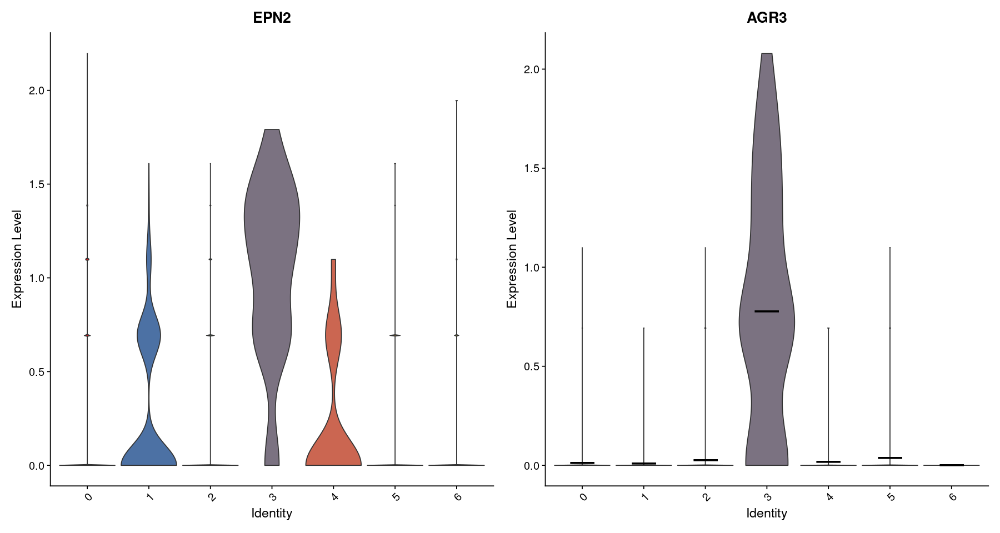

In [ ]:
VlnPlot(Her2p, features = c("EPN2", "AGR3"), group.by = "SCT_snn_res.0.4", pt.size = 0, cols = color, ncol = 2) +
  stat_summary(fun=mean, geom="point", shape=95, size=15, color = "black") + NoLegend()

## Gene Ontology (GO) Terms

After identifying the DEGs, we can explore the biological meaning of these expression differences by seeing which biological processes are represented by these genes.

In [ ]:
library(ReactomePA)
library(org.Hs.eg.db)
library(ggpubr)



ReactomePA v1.44.0  For help: https://yulab-smu.top/biomedical-knowledge-mining-book/

If you use ReactomePA in published research, please cite:
Guangchuang Yu, Qing-Yu He. ReactomePA: an R/Bioconductor package for reactome pathway analysis and visualization. Molecular BioSystems 2016, 12(2):477-479

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, intersect, is.unsorted, lapply, Map, mapply,
    match, mget, order, paste, pmax, pmax.int, pmin, pmin.int,
    Position, rank, rbind, Reduce, row

As an example, let's make a pathway enrichment analysis for DEGs in cluster 6. We will perform an overrepresentation analysis (ORA), which checks wether or not there are enough DEGs belonging to a specific biological pathway using Fisher's exact test followed by the Bonferroni multiple test correction. In this case, we are making an enrichment against Gene Ontology (GO), a database of biological processes.

[1] 16

[1] "ACCNUM"       "ALIAS"        "ENSEMBL"      "ENSEMBLPROT"  "ENSEMBLTRANS"
 [6] "ENTREZID"     "ENZYME"       "EVIDENCE"     "EVIDENCEALL"  "GENENAME"    
[11] "GENETYPE"     "GO"           "GOALL"        "IPI"          "MAP"         
[16] "OMIM"         "ONTOLOGY"     "ONTOLOGYALL"  "PATH"         "PFAM"        
[21] "PMID"         "PROSITE"      "REFSEQ"       "SYMBOL"       "UCSCKG"      
[26] "UNIPROT"

'select()' returned 1:1 mapping between keys and columns



[1] "125"   "2167"  "5346"  "1038"  "50486" "9370"

[1] 14

,ID,Description,GeneRatio,BgRatio,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<int>
R-HSA-163560,R-HSA-163560,Triglyceride catabolism,3/12,24/10955,2.006512e-06,0.0001123647,0.0000844847,FABP4/PLIN1/LIPE,3
R-HSA-8979227,R-HSA-8979227,Triglyceride metabolism,3/12,37/10955,7.641322e-06,0.0004279140,0.0001608699,FABP4/PLIN1/LIPE,3
R-HSA-381340,R-HSA-381340,Transcriptional regulation of white adipocyte differentiation,3/12,84/10955,9.102497e-05,0.0050973981,0.0012775434,FABP4/PLIN1/ADIPOQ,3


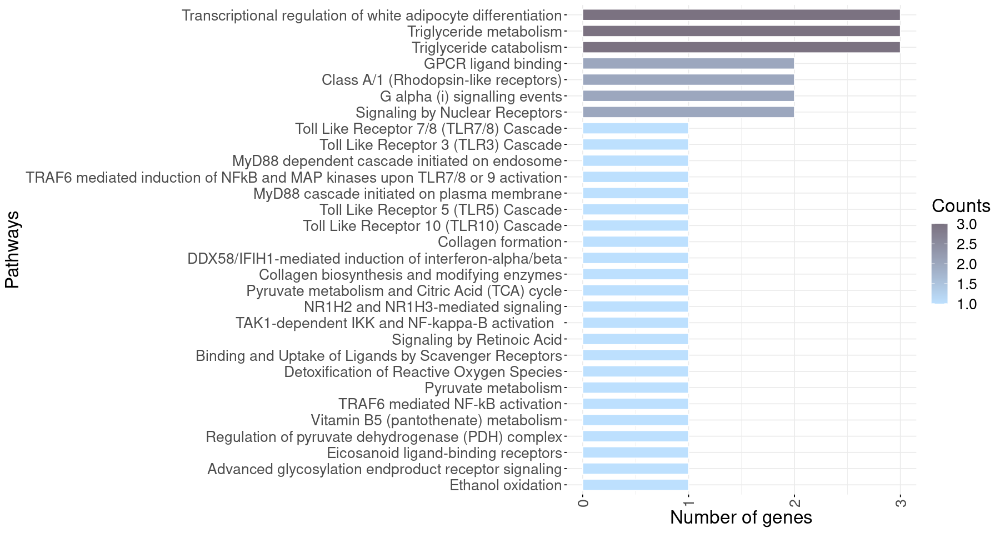

In [ ]:
#Select the DEGs of one cluster
geneList=Her2p.markers[which(Her2p.markers$cluster==6),"gene"]
length(geneList)

#Conversion of Gene Symbols to ENSMBL IDs
columns(org.Hs.eg.db)

symbol <- mapIds(org.Hs.eg.db,
                 keys=geneList,
                 column="ENTREZID",
                 keytype="SYMBOL",
                 multiVals="first")
symbol = as.vector(symbol)

geneList = symbol
head(geneList)
geneList = geneList[which(geneList!="NA")]
length(geneList)

#perform the pathway enrichment analysis
x <- enrichPathway(gene=geneList, organism = "human", pvalueCutoff=0.05, readable=T, pAdjustMethod = "bonferroni")
head(as.data.frame(x))

#Order by the pvalue adj
x@result = x@result[order(x=x@result$p.adjust, decreasing = FALSE),]
#select the 30 most significative pathways
x@result = x@result[1:30,]
#order the pathways (for the plot)
x@result = x@result[order(x=x@result$Count, decreasing = FALSE),]

newbar.dt = x@result

cluster6_enrichpathway <- ggbarplot(newbar.dt, x = "Description", y = "Count",
          fill = "Count",           # change fill color by mpg_level
          color = "white",            # Set bar border colors to white
          sort.val = "asc",          # Sort the value in descending order
          sort.by.groups = FALSE,     # Don't sort inside each group
          x.text.angle = 90,          # Rotate vertically x axis texts
          xlab = "Pathways",
          ylab = "Number of genes",
          legend.title = "Counts",
          rotate = TRUE,
          ggtheme = theme_minimal()
) + scale_fill_continuous(low="#bde0fe", high=color[4]) + theme(text = element_text(size=20))

cluster6_enrichpathway

## Pathways analysis with EnrichR

Now, we are going to make a similar analysis using EnrichR, which performs enrichment against multiple sources such as GO, KEGG, Reactome, among others. Let's test using cluster 6's DEGs once again.

In [ ]:
library(enrichR)
library(stringr)

Welcome to enrichR
Checking connection ... 

Enrichr ... 
Connection is Live!

FlyEnrichr ... 
Connection is Live!

WormEnrichr ... 
Connection is Live!

YeastEnrichr ... 
Connection is Live!

FishEnrichr ... 
Connection is Live!

OxEnrichr ... 
Connection is Live!



Enrichr ... 
Connection is Live!

FlyEnrichr ... 
Connection is Live!

WormEnrichr ... 
Connection is Live!

YeastEnrichr ... 
Connection is Live!

FishEnrichr ... 
Connection is Live!

OxEnrichr ... 
Connection is Live!



geneCoverage,genesPerTerm,libraryName,link,numTerms,appyter,categoryId
<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<dbl>
23601,2395,ARCHS4_Cell-lines,http://amp.pharm.mssm.edu/archs4,125,5496ef9c9ae9429184d0b9485c23ba468ee522a8,5
20883,299,ARCHS4_IDG_Coexp,http://amp.pharm.mssm.edu/archs4,352,ce60be284fdd5a9fc6240a355421a9e12b1ee84a,4
19612,299,ARCHS4_Kinases_Coexp,http://amp.pharm.mssm.edu/archs4,498,6721c5ed97b7772e4a19fdc3f797110df0164b75,2
25983,299,ARCHS4_TFs_Coexp,http://amp.pharm.mssm.edu/archs4,1724,8a468c3ae29fa68724f744cbef018f4f3b61c5ab,1
21809,2316,ARCHS4_Tissues,http://amp.pharm.mssm.edu/archs4,108,4126374338235650ab158ba2c61cd2e2383b70df,5
4271,128,Achilles_fitness_decrease,http://www.broadinstitute.org/achilles,216,83a710c1ff67fd6b8af0d80fa6148c40dbd9bc64,4
4320,129,Achilles_fitness_increase,http://www.broadinstitute.org/achilles,216,98366496a75f163164106e72439fb2bf2f77de4e,4
16129,292,Aging_Perturbations_from_GEO_down,http://www.ncbi.nlm.nih.gov/geo/,286,cd95fe1b505ba6f28cd722cfba50fdea979d3b4c,8
15309,308,Aging_Perturbations_from_GEO_up,http://www.ncbi.nlm.nih.gov/geo/,286,74c4f0a0447777005b2a5c00c9882a56dfc62d7c,8


[1] 16

Uploading data to Enrichr... Done.
  Querying Cancer_Cell_Line_Encyclopedia... Done.
  Querying Elsevier_Pathway_Collection... Done.
  Querying KEGG_2021_Human... Done.
  Querying CellMarker_Augmented_2021... Done.
  Querying Reactome_2016... Done.
  Querying GO_Biological_Process_2018... Done.
  Querying GO_Cellular_Component_2018... Done.
  Querying GO_Molecular_Function_2018... Done.
  Querying InterPro_Domains_2019... Done.
Parsing results... Done.


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
HS571T OVARY,3/222,0.0006790466,0.1099234,0,0,20.827187,151.93059,FABP4;ADH1B;C10ORF10
CALU6 LUNG,2/78,0.0017390969,0.1099234,0,0,37.421053,237.78794,LIPE;FABP4
KCIMOH1 PANCREAS,2/90,0.0023064447,0.1099234,0,0,32.298701,196.11927,FABP4;C10ORF10
MDAMB436 BREAST,2/94,0.0025125351,0.1099234,0,0,30.888199,184.91106,PLIN4;CDR1
HS604T HAEMATOPOIETIC AND LYMPHOID TISSUE,2/176,0.0085207544,0.1920951,0,0,16.264368,77.50379,ADH1B;C10ORF10
TC71 BONE,2/185,0.0093777699,0.1920951,0,0,15.457455,72.17725,PTGER3;CDR1
HS274T BREAST,2/194,0.0102719316,0.1920951,0,0,14.726190,67.42151,FABP4;ADH1B
SNU668 STOMACH,2/200,0.0108884250,0.1920951,0,0,14.275613,64.52656,TUSC5;FABP4
RAJI HAEMATOPOIETIC AND LYMPHOID TISSUE,2/207,0.0116280485,0.1920951,0,0,13.783275,61.39533,LIPE;CDR1


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
Lipolysis Regulation in Adipocyte,4/37,1.774933e-08,1.047211e-06,0,0,201.525253,3596.604619,LIPE;FABP4;PTGER3;PLIN1
Lipogenesis/Lipolysis Activation in Cancer Cells and Cancer-Associated Adipocytes,3/32,2.054081e-06,6.059538e-05,0,0,158.793103,2079.504008,LIPE;FABP4;PLIN1
NPR1/NPR2 -> Fatty Acid Signaling,2/8,1.675288e-05,3.294733e-04,0,0,475.666667,5230.877918,LIPE;PLIN1
Adipose Tissue Inflammation Provokes Insulin Resistance,2/15,6.261920e-05,7.418540e-04,0,0,219.461538,2124.045039,LIPE;FABP4
Proteins Involved in Polycystic Ovary Syndrome,3/99,6.286898e-05,7.418540e-04,0,0,47.807692,462.513496,LIPE;FABP4;ADIPOQ
Familial Partial Lipodystrophy Type 4 Progression (Hypothesis),2/17,8.103129e-05,7.968077e-04,0,0,190.180952,1791.632979,PLIN4;PLIN1
Androgen Deficiency in Male Obesity,2/24,1.639105e-04,1.381532e-03,0,0,129.623377,1129.821941,LIPE;ADIPOQ
Proteins Involved in Insulin Resistance,2/81,1.873727e-03,1.350921e-02,0,0,35.994575,226.039652,FABP4;ADIPOQ
Proteins with Altered Expression in Cancer Metabolic Reprogramming,2/85,2.060726e-03,1.350921e-02,0,0,34.253012,211.844494,LIPE;FABP4


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
Regulation of lipolysis in adipocytes,4/55,9.087003e-08,2.816971e-06,0,0,130.281046,2112.355454,LIPE;FABP4;PTGER3;PLIN1
PPAR signaling pathway,4/74,3.037880e-07,4.708713e-06,0,0,94.828571,1423.086293,FABP4;ADIPOQ;PLIN4;PLIN1
AMPK signaling pathway,2/120,4.054818e-03,4.067876e-02,0,0,24.050847,132.468450,LIPE;ADIPOQ
Apelin signaling pathway,2/137,5.248872e-03,4.067876e-02,0,0,21.004233,110.266804,LIPE;PLIN1
cAMP signaling pathway,2/216,1.261088e-02,7.463389e-02,0,0,13.197597,57.715667,LIPE;PTGER3
Thermogenesis,2/232,1.444527e-02,7.463389e-02,0,0,12.269565,51.990912,LIPE;PLIN1
Tyrosine metabolism,1/36,2.842478e-02,1.018158e-01,0,0,37.998095,135.291986,ADH1B
Fatty acid degradation,1/43,3.386312e-02,1.018158e-01,0,0,31.653968,107.162250,ADH1B
Type II diabetes mellitus,1/46,3.618510e-02,1.018158e-01,0,0,29.539259,98.043990,ADIPOQ


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
Mesenchymal Stem cell:White Adipose Tissue,5/80,3.805705e-09,3.158735e-07,0,0,120.66061,2339.21876,FABP4;ADH1B;ADIPOQ;PLIN4;PLIN1
Stem cell:Submandibular Gland,3/98,6.099360e-05,1.510891e-03,0,0,48.31336,468.86868,FABP4;ADH1B;PDK4
CD14+ Endothelial Progenitor cell:Blood,3/100,6.478178e-05,1.510891e-03,0,0,47.31245,456.30428,FABP4;GPX3;PDK4
Cancer Stem cell:Oral Cavity,3/104,7.281401e-05,1.510891e-03,0,0,45.42955,432.83468,GPX3;SAA1;PDK4
Fat Cell (adipocyte):Adipose Tissue,2/25,1.780806e-04,2.956139e-03,0,0,123.98137,1070.36511,FABP4;ADIPOQ
Endothelial cell:Heart,2/96,2.618735e-03,9.236587e-03,0,0,30.22796,179.70717,FABP4;PDK4
Vascular Endothelial cell:Placenta,2/99,2.781962e-03,9.236587e-03,0,0,29.28866,172.35201,FABP4;ADH1B
Extravillous Trophoblast cell:Placenta,2/99,2.781962e-03,9.236587e-03,0,0,29.28866,172.35201,ENPP2;G0S2
Mature Endothelial cell:Blood,2/100,2.837415e-03,9.236587e-03,0,0,28.98834,170.01260,FABP4;ADH1B


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
Hormone-sensitive lipase (HSL)-mediated triacylglycerol hydrolysis Homo sapiens R-HSA-163560,3/20,4.748696e-07,3.276601e-05,0,0,271.045249,3946.47995,LIPE;FABP4;PLIN1
"Lipid digestion, mobilization, and transport Homo sapiens R-HSA-73923",3/71,2.322409e-05,7.361724e-04,0,0,67.588235,721.18813,LIPE;FABP4;PLIN1
Transcriptional regulation of white adipocyte differentiation Homo sapiens R-HSA-381340,3/79,3.200750e-05,7.361724e-04,0,0,60.449393,625.62343,FABP4;ADIPOQ;PLIN1
Metabolism Homo sapiens R-HSA-1430728,7/1908,3.745054e-04,6.460218e-03,0,0,7.398504,58.37349,LIPE;FABP4;ADH1B;ADIPOQ;PDK4;G0S2;PLIN1
Metabolism of lipids and lipoproteins Homo sapiens R-HSA-556833,4/659,1.549216e-03,2.137918e-02,0,0,9.836641,63.64313,LIPE;FABP4;G0S2;PLIN1
Scavenging by Class B Receptors Homo sapiens R-HSA-3000471,1/5,3.993945e-03,4.593037e-02,0,0,333.000000,1839.15091,SAA1
AMPK inhibits chREBP transcriptional activation activity Homo sapiens R-HSA-163680,1/8,6.383144e-03,5.503401e-02,0,0,190.257143,961.57758,ADIPOQ
Formyl peptide receptors bind formyl peptides and many other ligands Homo sapiens R-HSA-444473,1/8,6.383144e-03,5.503401e-02,0,0,190.257143,961.57758,SAA1
Prostanoid ligand receptors Homo sapiens R-HSA-391908,1/9,7.178350e-03,5.503401e-02,0,0,166.466667,821.79362,PTGER3


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
regulation of cellular carbohydrate metabolic process (GO:0010675),2/13,4.656043e-05,0.006515428,0,0,259.38961,2587.3490,ADIPOQ;PDK4
regulation of fatty acid metabolic process (GO:0019217),2/14,5.429523e-05,0.006515428,0,0,237.76190,2335.0773,ADIPOQ;PDK4
regulation of glucose metabolic process (GO:0010906),2/25,1.780806e-04,0.009622147,0,0,123.98137,1070.3651,ADIPOQ;PDK4
regulation of fatty acid biosynthetic process (GO:0042304),2/28,2.240682e-04,0.009622147,0,0,109.65934,921.5289,ADIPOQ;PDK4
regulation of lipid biosynthetic process (GO:0046890),2/28,2.240682e-04,0.009622147,0,0,109.65934,921.5289,ADIPOQ;PDK4
regulation of cellular biosynthetic process (GO:0031326),2/29,2.405537e-04,0.009622147,0,0,105.59259,879.8574,ADIPOQ;PDK4
carbohydrate homeostasis (GO:0033500),2/63,1.138954e-03,0.039049856,0,0,46.65808,316.2319,ADIPOQ;PDK4
glucose homeostasis (GO:0042593),2/74,1.567121e-03,0.043407540,0,0,39.50794,255.1626,ADIPOQ;PDK4
negative regulation of inflammatory response (GO:0050728),2/78,1.739097e-03,0.043407540,0,0,37.42105,237.7879,ADIPOQ;SAA1


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
lipid droplet (GO:0005811),5/64,1.215894e-09,1.094305e-08,0,0,153.505393,3151.125891,LIPE;FABP4;PLIN4;G0S2;PLIN1
endocytic vesicle lumen (GO:0071682),1/18,1.430841e-02,6.438785e-02,0,0,78.301961,332.541203,SAA1
cytoplasmic microtubule (GO:0005881),1/38,2.998152e-02,8.994455e-02,0,0,35.940541,126.049738,SAA1
endocytic vesicle (GO:0030139),1/108,8.301704e-02,1.771014e-01,0,0,12.384424,30.821231,SAA1
cytoplasmic vesicle lumen (GO:0060205),1/129,9.838969e-02,1.771014e-01,0,0,10.341667,23.980456,SAA1
microtubule (GO:0005874),1/210,1.554501e-01,2.331752e-01,0,0,6.307815,11.741559,SAA1
mitochondrion (GO:0005739),2/1026,1.968387e-01,2.474552e-01,0,0,2.645089,4.299250,PDK4;G0S2
mitochondrial matrix (GO:0005759),1/308,2.199602e-01,2.474552e-01,0,0,4.272964,6.470587,PDK4
integral component of plasma membrane (GO:0005887),2/1463,3.289066e-01,3.289066e-01,0,0,1.811186,2.014005,PTGER3;ENPP2


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
prostaglandin E receptor activity (GO:0004957),1/6,0.004790942,0.04783775,0,0,266.386667,1422.778691,PTGER3
"alcohol dehydrogenase activity, zinc-dependent (GO:0004024)",1/6,0.004790942,0.04783775,0,0,266.386667,1422.778691,ADH1B
alcohol dehydrogenase (NAD) activity (GO:0004022),1/8,0.006383144,0.04783775,0,0,190.257143,961.577580,ADH1B
prostaglandin receptor activity (GO:0004955),1/10,0.007972959,0.04783775,0,0,147.962963,714.912587,PTGER3
peptidase activator activity (GO:0016504),1/16,0.012728113,0.06039068,0,0,88.751111,387.304713,PCOLCE2
lysophospholipase activity (GO:0004622),1/19,0.015097671,0.06039068,0,0,73.948148,310.080470,ENPP2
zinc ion binding (GO:0008270),2/302,0.023718822,0.08132167,0,0,9.373333,35.070199,ADH1B;ENPP2
transition metal ion binding (GO:0046914),2/399,0.039615881,0.10883561,0,0,7.048219,22.755352,ADH1B;ENPP2
collagen binding (GO:0005518),1/52,0.040813353,0.10883561,0,0,26.056209,83.347194,PCOLCE2


Term,Overlap,P.value,Adjusted.P.value,Old.P.value,Old.Adjusted.P.value,Odds.Ratio,Combined.Score,Genes
<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<chr>
"Somatomedin B, chordata",1/5,0.003993945,0.01676203,0,0,333.000000,1839.150909,ENPP2
Histidine kinase domain,1/5,0.003993945,0.01676203,0,0,333.000000,1839.150909,PDK4
"Branched-chain alpha-ketoacid dehydrogenase kinase/Pyruvate dehydrogenase kinase, N-terminal",1/5,0.003993945,0.01676203,0,0,333.000000,1839.150909,PDK4
DNA/RNA non-specific endonuclease,1/6,0.004790942,0.01676203,0,0,266.386667,1422.778691,ENPP2
"Extracellular Endonuclease, subunit A",1/6,0.004790942,0.01676203,0,0,266.386667,1422.778691,ENPP2
Alpha/beta hydrolase fold-3,1/7,0.005587342,0.01676203,0,0,221.977778,1151.454594,LIPE
Somatomedin B domain,1/10,0.007972959,0.02050189,0,0,147.962963,714.912587,ENPP2
"Alcohol dehydrogenase, C-terminal",1/15,0.011937074,0.02146262,0,0,95.095238,421.091823,ADH1B
"Alcohol dehydrogenase, N-terminal",1/15,0.011937074,0.02146262,0,0,95.095238,421.091823,ADH1B


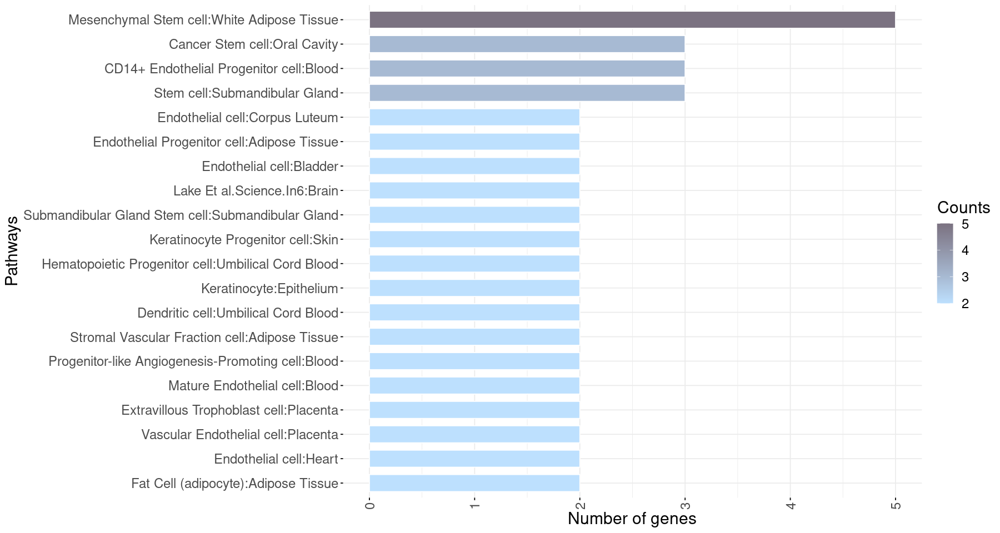

In [ ]:
#See the list of available databases
listEnrichrSites()
dbs <- listEnrichrDbs()
dbs %>% dplyr::arrange(libraryName)

dbs <- c("Cancer_Cell_Line_Encyclopedia",
         "Elsevier_Pathway_Collection",
         "KEGG_2021_Human",
         "CellMarker_Augmented_2021",
         "Reactome_2016",
         "GO_Biological_Process_2018",
         "GO_Cellular_Component_2018",
         "GO_Molecular_Function_2018",
         "InterPro_Domains_2019")

#EnrichR requires the gene symbols (not the Ensembl IDs)
geneList=Her2p.markers[which(Her2p.markers$cluster==6),"gene"]
length(geneList)

enriched.Paths <- enrichr(geneList, dbs)

enriched.Paths[[1]] #"Cancer_Cell_Line_Encyclopedia"
enriched.Paths[[2]] #"Elsevier_Pathway_Collection"
enriched.Paths[[3]] #"KEGG_2021_Human"
enriched.Paths[[4]] #"CellMarker_Augmented_2021"
enriched.Paths[[5]] #"Reactome_2016
enriched.Paths[[6]] #"GO_Biological_Process_2018" ######
enriched.Paths[[7]] #"GO_Cellular_Component_2018"
enriched.Paths[[8]] #"GO_Molecular_Function_2018" #######
enriched.Paths[[9]] #"InterPro_Domains_2019"

Rpath = enriched.Paths[[4]]

#Count the nuber of genes per Pathways
Gene_Count = c()
for(x in 1:dim(Rpath)[1]){
  Gene_Count = c(Gene_Count,str_split(Rpath$Overlap[x], pattern = "/" )[[1]][1])
}

Rpath$Gene_Count = as.numeric(Gene_Count)
Rpath = Rpath[order(x=Rpath$Adjusted.P.value, decreasing = FALSE),]
Rpath = Rpath[Rpath$Adjusted.P.value<0.05,]
Rpath = Rpath[1:20,]
Rpath = Rpath[order(x=Rpath$Gene_Count, decreasing = TRUE),]


cluster6_enrichR <- ggbarplot(Rpath, x = "Term", y = "Gene_Count",
          fill = "Gene_Count",           # change fill color by mpg_level
          color = "white",            # Set bar border colors to white
          sort.val = "asc",          # Sort the value in descending order
          sort.by.groups = FALSE,     # Don't sort inside each group
          x.text.angle = 90,          # Rotate vertically x axis texts
          xlab = "Pathways",
          ylab = "Number of genes",
          legend.title = "Counts",
          rotate = TRUE,
          ggtheme = theme_minimal()
) + scale_fill_continuous(low="#bde0fe", high=color[4]) + theme(text = element_text(size=18))
cluster6_enrichR
# [H] Characterize the other clusters (binome exercise)

# EXERCISE 2: CELL TYPES DECONVOLUTION

As was said before, spatial transcriptomics measures gene expression from RNA extracted from thousands of spots in a slide. That means each spot may contain multiple cells, which makes it a series of "mini-bulk RNA-seq" experiments. We can then try to see which cell populations are present in each spot by using deconvolution strategies, which were previously used in bulk RNA-seq data with the same goal. Similarly to deconvolution in classic bulk RNA-seq, we can use single-cell data as a reference for this process.

## Load the SC dataset

First of all, let's load a scRNA-seq dataset with previously identified cell populations along with a spatial dataset which we will normalize using SCT. In order to get better results, both datasets are derived from breast cancer samples. In the UMAP below, we can see that different immune cells were identified in the single cell data. We can also take a look at the spatial dataset we're using at this section to have a glimpse of its characteristics.

Calculating cluster B_cell

Calculating cluster T_cell

Calculating cluster Cancer_cell

Calculating cluster Myeloid_cell

Calculating cluster Endothelial_cell

Calculating cluster Fibroblast

Calculating cluster pDC

Calculating cluster Mast_cell




          B_cell           T_cell      Cancer_cell     Myeloid_cell 
             183              391              650              504 
Endothelial_cell       Fibroblast              pDC        Mast_cell 
             824              699              651               43 

[1] "RNA"

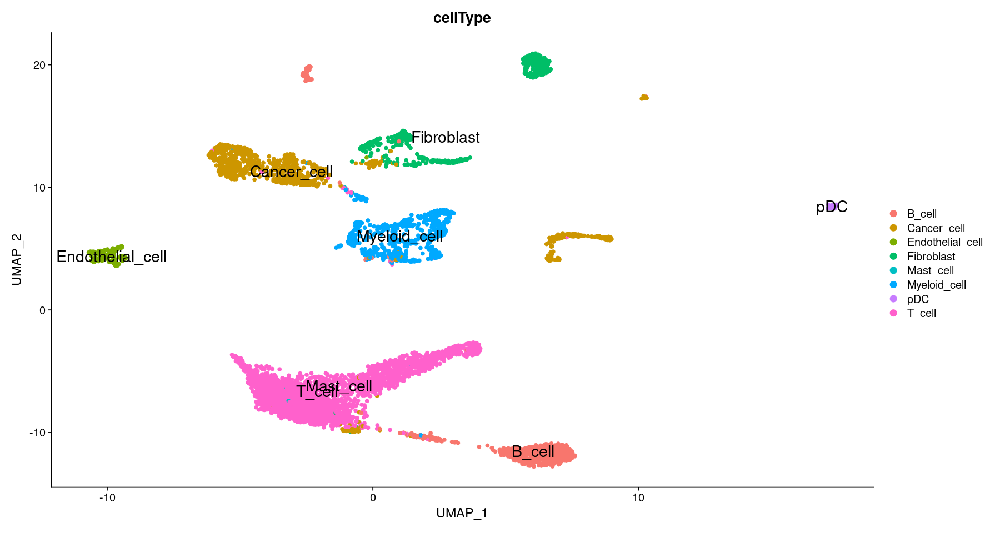

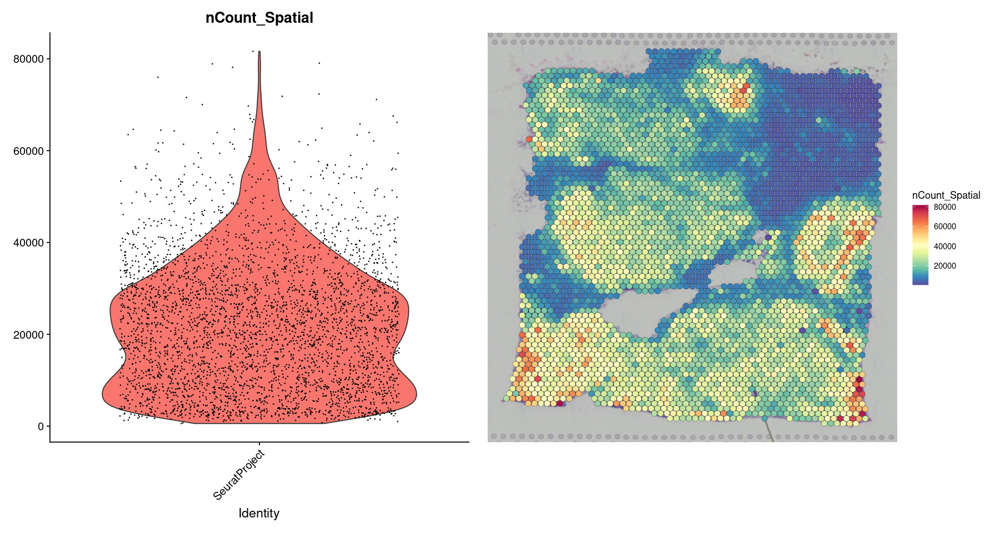

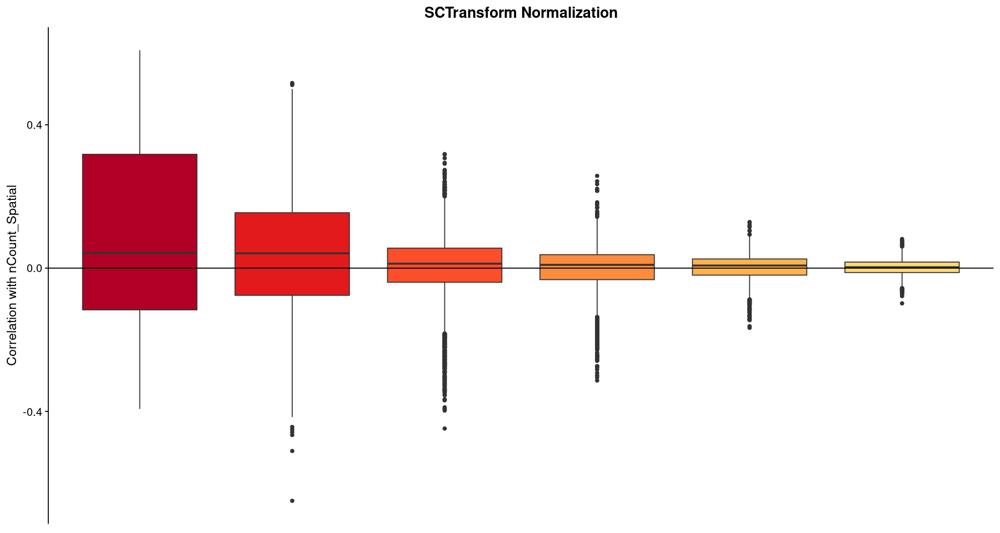

In [ ]:
library(patchwork)

SC.data = readRDS("ST_Exercises/scRNASeq_pac2_processed.rds")

Idents(SC.data) = "cellType"

DimPlot(object = SC.data, reduction = 'umap', label = TRUE, label.size=6,
        group.by = "cellType", pt.size = 1.5)

SC.markers <- FindAllMarkers(object = SC.data, only.pos = TRUE, min.pct = 0.10, logfc.threshold = 0.10)
SC.markers = SC.markers[which(SC.markers$p_val_adj<0.05 & SC.markers$avg_log2FC>0.5),]
table(SC.markers$cluster)

DefaultAssay(SC.data)#################################################

#10X Visium FFPE Sample
SP = Load10X_Spatial(data.dir="ST_Exercises/10X_Spatial_T_Breast_Block_A_Section1",
                     filename = "V1_Breast_Cancer_Block_A_Section_1_filtered_feature_bc_matrix.h5")

#
plot1 <- VlnPlot(SP, features = "nCount_Spatial", pt.size = 0.1) + NoLegend()
plot2 <- SpatialFeaturePlot(SP, features = "nCount_Spatial") + theme(legend.position = "right")
wrap_plots(plot1, plot2)

#Normalization by SCT
SP <- SCTransform(SP, assay = "Spatial", verbose = FALSE, return.only.var.genes = FALSE)

# DefaultAssay(SP) = "Spatial"

SP <- GroupCorrelation(SP, group.assay = "Spatial", assay = "SCT", slot = "scale.data", do.plot = FALSE)


## Deconvolution Pipeline

Then, we can move on to the deconvolution pipeline. We will use a library called [SPOTlight](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC8136778/) for that. Briefly, this tool employs a seeded non-negative matrix factorization (NMF) regression based on cell type marker genes derived from a single-cell reference to deconvolute spot data in the spatial dataset, resulting in a matrix of  estimated cell type subpopulation proportions per spot.
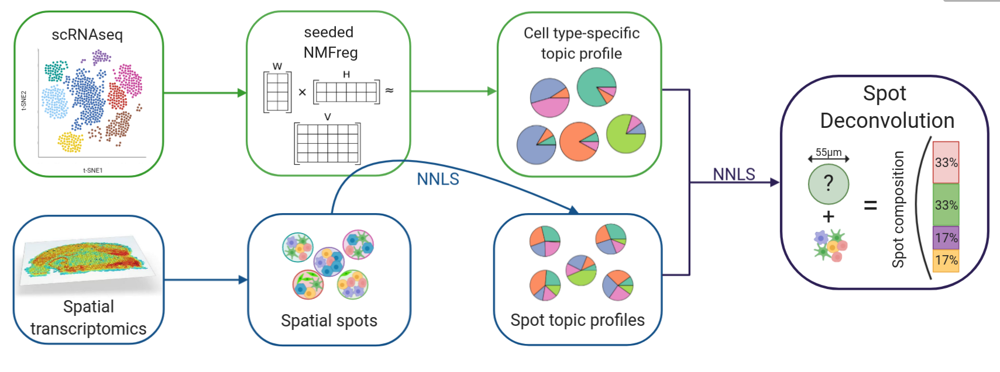

In [ ]:
library(SingleCellExperiment)
library(SPOTlight)
library(DT)
library(ggcorrplot)
library(scatterpie)

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following objects are masked from ‘package:Biobase’:

    anyMissing, rowMedians


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCum

First, we have to format the spatial and single cell datasets to make them compatible with SPOTlight. Then, we will select marker genes to better separate the cell populations. DEGs are good candidates for that as they tend to have a clear variation among clusters.

In [ ]:
#format the dataset
spe = SP
sce = as.SingleCellExperiment(SC.data)

# Give the DEGs as they are better to define each cell type
hvg = unique(SC.markers$gene)
colLabels(sce) <- colData(sce)$cellType

#Cell Downsampling
# split cell indices by identity
idx <- split(seq(ncol(sce)), sce$cellType)
# downsample to at most 100 per identity & subset
n_cells <- 100
cs_keep <- lapply(idx, function(i) {
  n <- length(i)
  if (n < n_cells)
    n_cells <- n
  sample(i, n_cells)
})
sce <- sce[, unlist(cs_keep)]


Finally, we can perform the deconvolution. We will use the single cell dataset as a reference, weighting the marker genes (DEGs from single cell dataset) weighted by average log2 fold change. As a result, we get a matrix containing cell population proportions in each spot in the spatial dataset.

In [ ]:
#Deconvolution
res <- SPOTlight(
  x = sce,
  y = spe@assays$SCT@counts,#spe,
  groups = sce$cellType,
  mgs = SC.markers,
  hvg = hvg,
  weight_id = "avg_log2FC",
  group_id = "cluster",
  gene_id = "gene"
  )

# Extract deconvolution matrix
head(mat <- res$mat)[, seq_len(3)]

head(spe@meta.data)
# Extract NMF model fit
mod <- res$NMF


Scaling count matrix

Seeding initial matrices

Training NMF model

Time for training: 2.38min

Deconvoluting mixture data



,B_cell,Cancer_cell,Endothelial_cell
AAACAAGTATCTCCCA-1,0.08034916,0.21347456,0.04955559
AAACACCAATAACTGC-1,0.12034799,0.33415508,0.06647026
AAACAGAGCGACTCCT-1,0.12694591,0.33913285,0.06079018
AAACAGGGTCTATATT-1,0.26565219,0.08467735,0.05668420
AAACAGTGTTCCTGGG-1,0.10366810,0.38300039,0.04691411
AAACATTTCCCGGATT-1,0.05709834,0.42557540,0.04550851


,orig.ident,nCount_Spatial,nFeature_Spatial,nCount_SCT,nFeature_SCT
,<fct>,<dbl>,<int>,<dbl>,<int>
AAACAAGTATCTCCCA-1,SeuratProject,12072,4408,19774,4640
AAACACCAATAACTGC-1,SeuratProject,54083,9001,21135,6559
AAACAGAGCGACTCCT-1,SeuratProject,4237,2377,18940,4827
AAACAGGGTCTATATT-1,SeuratProject,22649,5846,21554,5843
AAACAGTGTTCCTGGG-1,SeuratProject,51367,8691,21101,6375
AAACATTTCCCGGATT-1,SeuratProject,28157,7240,21950,7179


In [ ]:
str(mat)

 num [1:3798, 1:8] 0.0803 0.1203 0.1269 0.2657 0.1037 ...
 - attr(*, "dimnames")=List of 2
  ..$ : chr [1:3798] "AAACAAGTATCTCCCA-1" "AAACACCAATAACTGC-1" "AAACAGAGCGACTCCT-1" "AAACAGGGTCTATATT-1" ...
  ..$ : chr [1:8] "B_cell" "Cancer_cell" "Endothelial_cell" "Fibroblast" ...


Then, we can visualize the results of the deconvolution. We can check if cell population's topics (specific signatures calculated based on gene expression distributions among cell populations) were successfully generated, how uniform these signatures are in identified cells and which marker genes were identified for each cell population by the deconvolution algorithm.

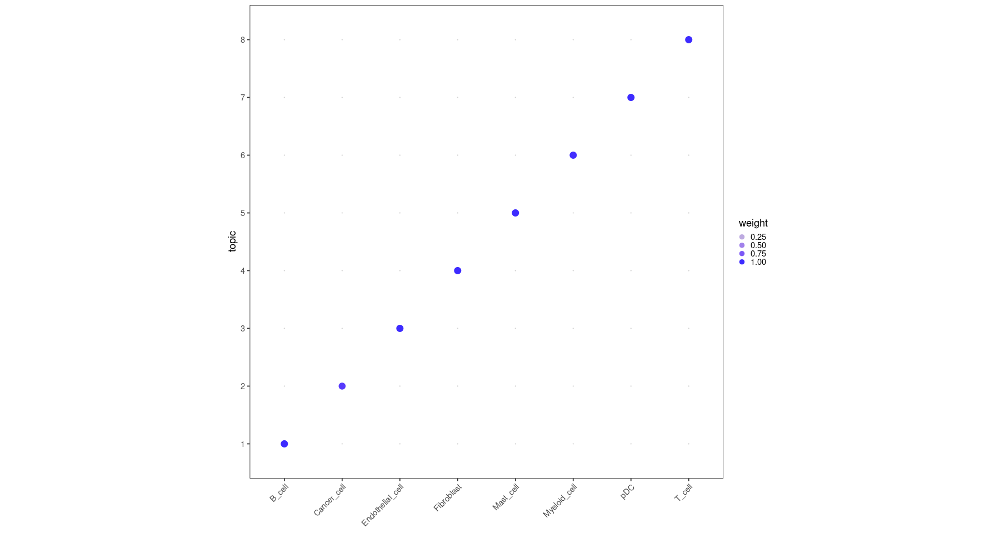

In [ ]:
#Visualization
#evaluate how specific each topic signature is for each cell identity
plotTopicProfiles(
  x = mod,
  y = sce$cellType,
  facet = FALSE,
  min_prop = 0.01,
  ncol = 1) +
  theme(aspect.ratio = 1)

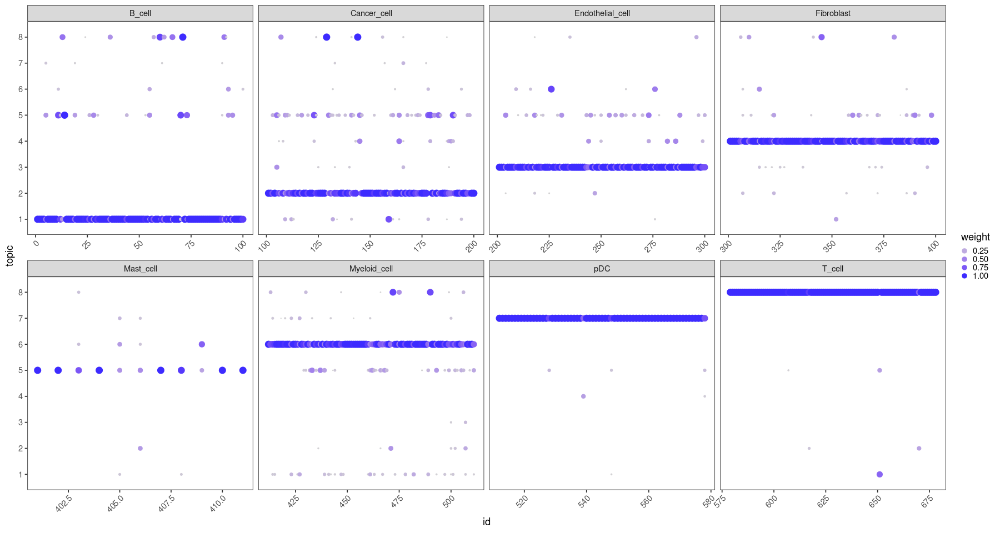

In [ ]:
#we also want to ensure that all the cells from the same cell identity share a similar topic profile
plotTopicProfiles(
  x = mod,
  y = sce$cellType,
  facet = TRUE,
  min_prop = 0.01,
  ncol = 4)

,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8
CD79A,0.003619416,0,0.0000000000,0,0.000000e+00,0,0.0000000000,0.000000e+00
MS4A1,0.003537154,0,0.0000000000,0,0.000000e+00,0,0.0000000000,0.000000e+00
IGHM,0.001705763,0,0.0000000000,0,0.000000e+00,0,0.0007082153,0.000000e+00
CD79B,0.003594528,0,0.0002547905,0,6.143782e-280,0,0.0000000000,2.679495e-162
VPREB3,0.002905214,0,0.0000000000,0,0.000000e+00,0,0.0000000000,0.000000e+00
BANK1,0.003173044,0,0.0000000000,0,0.000000e+00,0,0.0000000000,0.000000e+00


HTML widgets cannot be represented in plain text (need html)

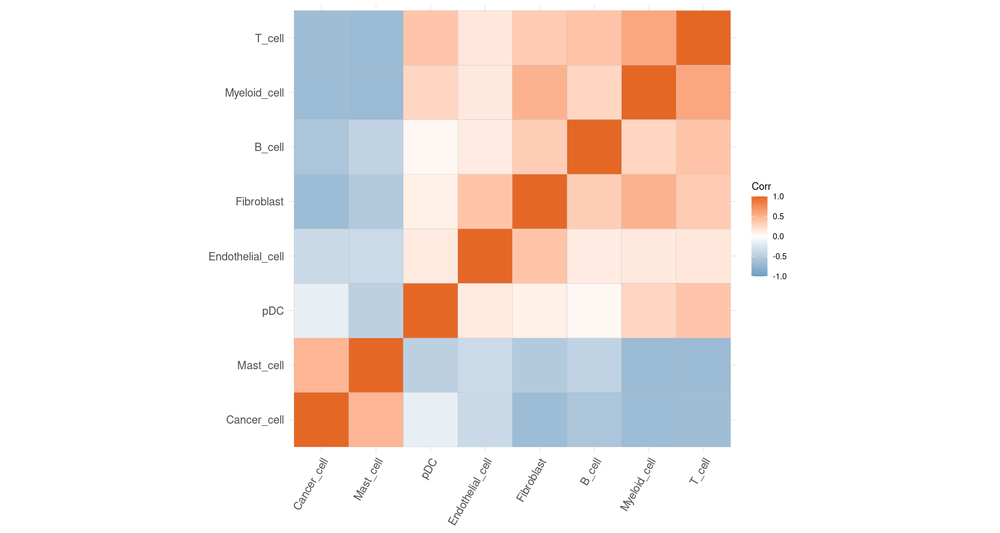

In [ ]:
#we can take a look at which genes the model learned for each topic
#Higher values indicate that the gene is more relevant for that topic.
#In the below table we can see how the top genes for Topic1 are characteristic for B cells (i.e. CD79A, CD79B, MS4A1…)
sign <- NMF::basis(mod)
colnames(sign) <- paste0("Topic", seq_len(ncol(sign)))
head(sign)

# This can be dynamically visualized with DT
DT::datatable(sign, fillContainer = TRUE, filter = "top")

#Spatial Correlation Matrix
plotCorrelationMatrix(mat)

After identifying cell populations per spot, we can plot these populations over the tissue slide. Each spot can be converted into a pie chart, so that we can see the proportion of cell populations per spatial coordinate.

In [ ]:
#pie chart
ct <- colnames(mat)
mat[mat < 0.1] <- 0

# Define color palette
# (here we use 'paletteMartin' from the 'colorBlindness' package)
paletteMartin <- c("#000000", "#004949", "#009292", "#ff6db6", "#ffb6db", "#490092", "#006ddb", "#b66dff", "#6db6ff", "#b6dbff", "#920000", "#924900", "#db6d00", "#24ff24", "#ffff6d")
pal <- colorRampPalette(paletteMartin)(length(ct))
names(pal) <- ct

In [ ]:
m2 = as.matrix(mat)

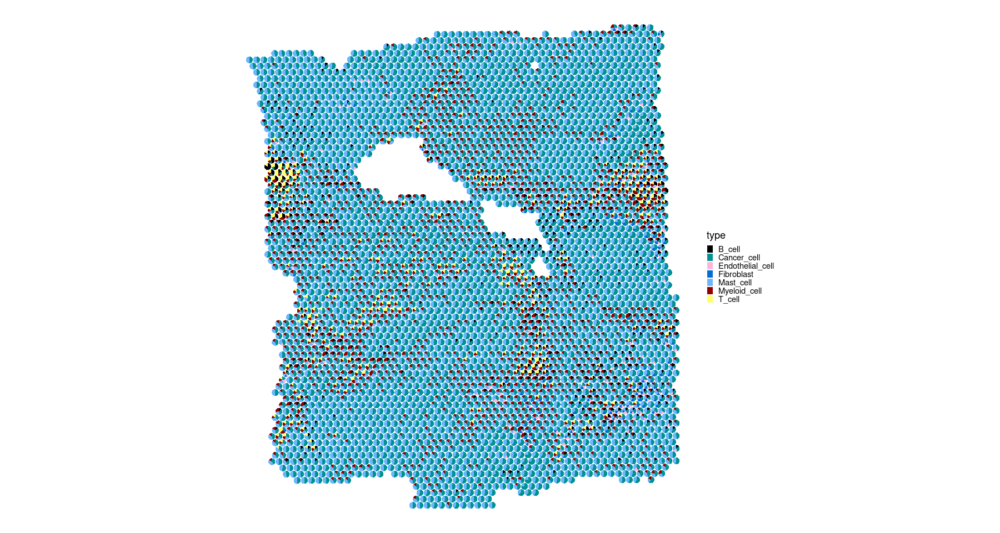

In [ ]:
plotSpatialScatterpie(
  x = spe,
  y = mat,
  cell_types = unique(sce$cellType),
  img = F,
  scatterpie_alpha = 1,
  pie_scale = 0.4) +
  scale_fill_manual(
    values = pal,
    breaks = names(pal))

In order to better visualize the pie charts, we can save this last plot as a PDF and have a closer view.

In [ ]:
ggsave("Deconvolution.pdf",width = 12, height = 12)